In [19]:
! nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2017 NVIDIA Corporation
Built on Fri_Sep__1_21:08:03_CDT_2017
Cuda compilation tools, release 9.0, V9.0.176


In [20]:
import coco, glob, h5py, json, math, matplotlib, os, PIL, random, re, skimage, sys, time, torch
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch.utils.data

from azure.storage import CloudStorageAccount
from azure.storage.blob import BlockBlobService
from PIL import Image, ImageOps
from skimage import draw
from torch.autograd import Variable
from torchvision import datasets

# Import Mask R-CNN
TOP_DIR = os.path.abspath("../")
sys.path.append(TOP_DIR)
import fish_pytorch_style, utils, visualize
import model as modellib

from config import Config
from model import log

In [21]:
%matplotlib inline

In [ ]:
%load_ext autoreload
%autoreload 2

In [22]:
%run AzureStorageHelper.ipynb

In [23]:
# Root directory of the project
TOP_DIR = os.path.abspath("../")

# Root directory of the project
ROOT_DIR = os.getcwd()

# Directory of images to run detection on
DATA_DIR = os.path.join(ROOT_DIR, 'frames')

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, 'logs')

### Notebook Preferences

In [24]:
def get_ax(rows=1, cols=1, size=8):
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

### List Training Runs

In [25]:
list_files(model_weights_share)

custom20180725T0702
custom20180728T1330
custom20180802T1151


### List Model Weights

In [26]:
folder = 'custom20180728T1330'

list_files(model_weights_share, folder)

mask_rcnn_custom_0001.pth
mask_rcnn_custom_0002.pth
mask_rcnn_custom_0003.pth
mask_rcnn_custom_0004.pth
mask_rcnn_custom_0005.pth
mask_rcnn_custom_0006.pth
mask_rcnn_custom_0007.pth
mask_rcnn_custom_0008.pth
mask_rcnn_custom_0009.pth
mask_rcnn_custom_0010.pth
mask_rcnn_custom_0011.pth
mask_rcnn_custom_0012.pth
mask_rcnn_custom_0013.pth
mask_rcnn_custom_0014.pth
mask_rcnn_custom_0015.pth
mask_rcnn_custom_0016.pth
mask_rcnn_custom_0017.pth
mask_rcnn_custom_0018.pth
mask_rcnn_custom_0019.pth
mask_rcnn_custom_0020.pth
mask_rcnn_custom_0021.pth
mask_rcnn_custom_0022.pth
mask_rcnn_custom_0023.pth
mask_rcnn_custom_0024.pth
mask_rcnn_custom_0025.pth
mask_rcnn_custom_0026.pth
mask_rcnn_custom_0027.pth
mask_rcnn_custom_0028.pth
mask_rcnn_custom_0029.pth
mask_rcnn_custom_0030.pth
mask_rcnn_custom_0031.pth
mask_rcnn_custom_0032.pth
mask_rcnn_custom_0033.pth
mask_rcnn_custom_0034.pth
mask_rcnn_custom_0035.pth
mask_rcnn_custom_0036.pth
mask_rcnn_custom_0037.pth
mask_rcnn_custom_0038.pth
mask_rcnn_cu

### Select Model Weights

In [27]:
file_name = 'mask_rcnn_custom_0160.pth'

download_path = os.path.join(os.getcwd(), file_name)

download_file(model_weights_share, folder, file_name, download_path, overwrite=True)

MODEL_WEIGHTS = download_path

Copying to /home/wonderwoman/ntfish-modeltraining-gpu/mask_rcnn_custom_0160.pth


### Test Set

In [28]:
download_files(model_training_share, 'test', download_path='./frames/test')

In [29]:
class_names = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10']

In [34]:
class ModelConfig(Config):
    # GPU_COUNT * IMAGES_PER_GPU
    BATCH_SIZE = 2
    
    COCO_MODEL_PATH = MODEL_WEIGHTS
    
    DETECTION_MIN_CONFIDENCE = 0.70
    
    GPU_COUNT = 1
    
    IMAGES_PER_GPU = 2
    
    IMAGE_MAX_DIM = 1920
    
    LEARNING_RATE = 0.001
    
    NAME = "custom"

    # Number of classes (including background)
    NUM_CLASSES = 10 + 1
    
    # Necessary for docker image to optimize memory usage best
    NUM_WORKERS = 0
    
    # Number of training steps per epoch
    STEPS_PER_EPOCH = 5
    
    VALIDATION_STEPS = 5
    
# Configurations
config = ModelConfig()
config.display()


Configurations:
BACKBONE_SHAPES                [[480 480]
 [240 240]
 [120 120]
 [ 60  60]
 [ 30  30]]
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COCO_MODEL_PATH                /home/wonderwoman/ntfish-modeltraining-gpu/mask_rcnn_custom_0160.pth
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
GPU_COUNT                      1
IMAGENET_MODEL_PATH            /home/wonderwoman/ntfish-modeltraining-gpu/resnet50_imagenet.pth
IMAGES_PER_GPU                 2
IMAGE_MAX_DIM                  1920
IMAGE_MIN_DIM                  800
IMAGE_PADDING                  True
IMAGE_SHAPE                    [1920 1920    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTANCES               100
MEAN_PIXEL                     [123.7 116.8 103.9]
MINI_MASK_

### Initialize Model

In [35]:
model = modellib.MaskRCNN(config=config, model_dir=MODEL_DIR)

if config.GPU_COUNT > 0:
    print('Cuda!', config.GPU_COUNT)
    model = model.cuda()

pretrained_state = torch.load(MODEL_WEIGHTS)
model_state = model.state_dict()

pretrained_state = { k:v for k,v in pretrained_state.items() if k in model_state and v.size() == model_state[k].size() }
model_state.update(pretrained_state)
model.load_state_dict(model_state)

Cuda! 1


### Score using Test Set

In [36]:
class InferenceConfig(ModelConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 2

inference_config = InferenceConfig()

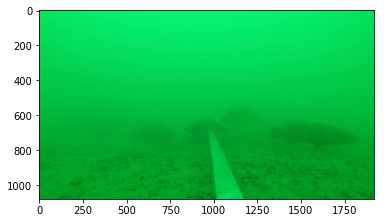

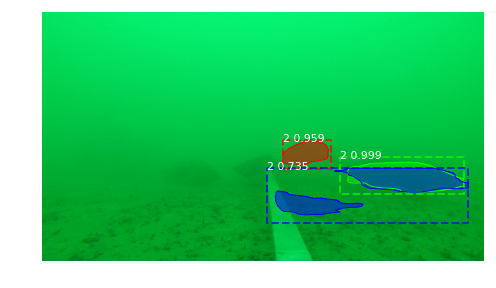

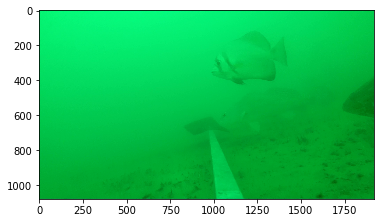

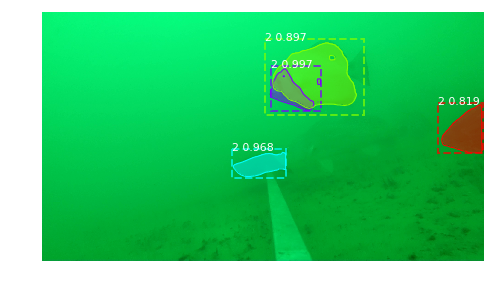

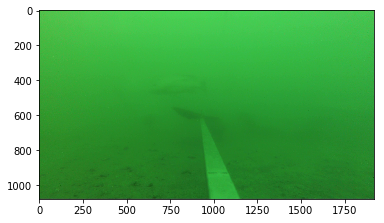

...

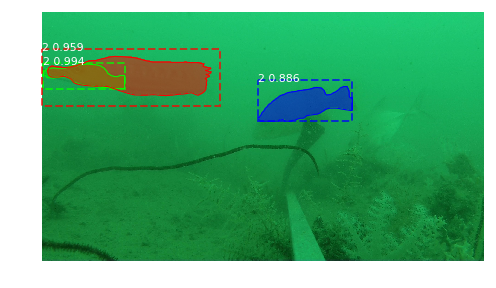

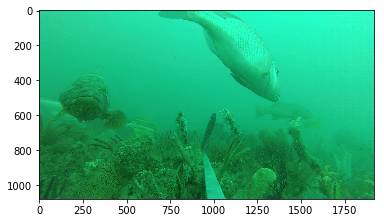

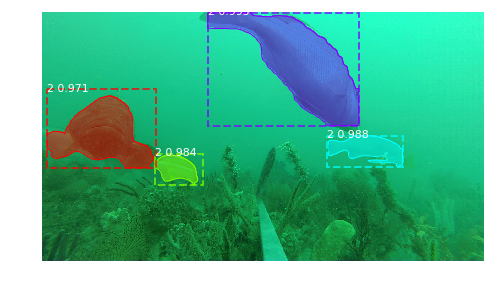

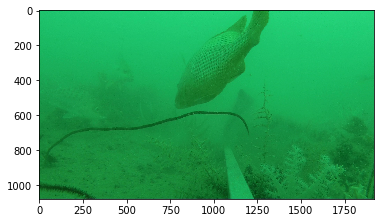

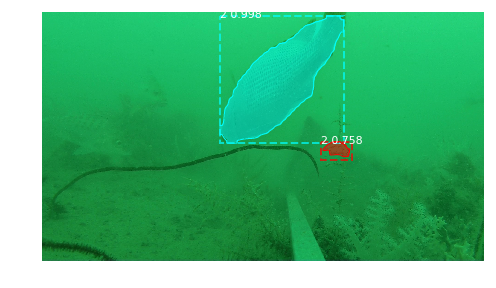

In [33]:
test_set = glob.glob(os.path.join('frames' , 'test', '*.jpg'))

for test in test_set:
    try:
        original_image = plt.imread(test)
        plt.imshow(original_image)
        plt.show()
        results = model.detect([original_image])

        r = results[0]
        visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'], ax=get_ax())
    except IndexError as index_error:
        print(index_error)